# (04) CelebA: residual error look whitened?

project = ```Retina```, host = ```mach```, device = ```cuda:1```

**Motivation**: <br>


In [1]:
# HIDE CODE


import os, sys
from IPython.display import display

# tmp & extras dir
git_dir = os.path.join(os.environ['HOME'], 'Dropbox/git')
extras_dir = os.path.join(git_dir, 'jb-progress-2025/_extras')
fig_base_dir = os.path.join(git_dir, 'jb-progress-2025/figs')
tmp_dir = os.path.join(git_dir, 'jb-progress-2025/tmp')

# GitHub
sys.path.insert(0, os.path.join(git_dir, '_IterativeVAE'))
from figures.convergence import plot_convergence
from figures.imgs import plot_weights
from figures.fighelper import *
from main.train import *

# warnings, tqdm, & style
warnings.filterwarnings('ignore', category=DeprecationWarning)
warnings.filterwarnings('ignore', category=FutureWarning)
warnings.filterwarnings('ignore', category=UserWarning)
from rich.jupyter import print
%matplotlib inline
set_style()

In [2]:
# HIDE CODE


from analysis.fourier import power_spectrum_2d


def _plot_selected_samples(select_from=None, ncols=30, seed=0, dim=16):
    rng = get_rng(seed)

    nrows = 4
    fig, axes = create_figure(nrows, ncols, (1 * ncols + 0.1, 1 * nrows), 'all', 'all')

    select_from = order[:500] if select_from is None else select_from
    selected_ids = rng.choice(select_from, size=ncols, replace=False)

    for i in range(ncols):
        idx = selected_ids[i]
        axes[0, i].imshow(tonp(true[idx]).reshape(dim, dim), cmap='Greys_r')
        axes[1, i].imshow(tonp(pred[idx]).reshape(dim, dim), cmap='Greys_r')
        axes[2, i].imshow(tonp(error[idx]).reshape(dim, dim), cmap='Greys_r')
        axes[3, i].imshow(tonp(whitened[idx]).reshape(dim, dim), cmap='Greys_r')

    axes[0, 0].set_ylabel('img', fontsize=15)
    axes[1, 0].set_ylabel('pred', fontsize=15)
    axes[2, 0].set_ylabel('error', fontsize=15)
    axes[3, 0].set_ylabel('whitened', fontsize=15)
    
    remove_ticks(axes, False)
    plt.show()


def _plot_sample_hists(num_samples=-1):
    fig, axes = create_figure(1, 3)
    sns.histplot(tonp(true[:num_samples]).ravel(), label='img', color='dimgrey', stat='percent', ax=axes[0])
    sns.histplot(tonp(pred[:num_samples]).ravel(), label='pred', color='C0', stat='percent', ax=axes[1])
    sns.histplot(tonp(error[:num_samples]).ravel(), label='error', color='C3', stat='percent', ax=axes[2])
    add_legend(axes)
    plt.show()


def _plot_power_spectrum(normalize=False, add_whitened=True):
    shape = (-1, *tr.model.cfg.input_sz)
    fig, axes = create_figure(1, 2, (8, 3.5), 'all', 'all')

    # true
    data = tr.to(true.reshape(shape))
    if normalize:
        data = (data - data.mean()) / data.std()
    radial_freq, radial_power = power_spectrum_2d(data)
    axes[0].loglog(radial_freq, radial_power, label='img', color='dimgrey', marker='o')
    axes[1].loglog(radial_freq, radial_power, label='img', color='dimgrey', marker='o')
    
    # whitened
    if add_whitened:
        data = tr.to(whitened.reshape(shape))
        if normalize:
            data = (data - data.mean()) / data.std()
        radial_freq, radial_power = power_spectrum_2d(data)
        axes[1].loglog(radial_freq, radial_power, label='whitened', color='C1', marker='o')

    # pred
    data = tr.to(pred.reshape(shape))
    if normalize:
        data = (data - data.mean()) / data.std()
    radial_freq, radial_power = power_spectrum_2d(data)
    axes[0].loglog(radial_freq, radial_power, label='pred', color='C0', marker='o')

    # error
    data = tr.to(error.reshape(shape))
    if normalize:
        data = (data - data.mean()) / data.std()
    radial_freq, radial_power = power_spectrum_2d(data)
    axes[0].loglog(radial_freq, radial_power, label='error', color='C3', marker='o')

    axes[0].set(xlabel='Spatial Frequency', ylabel='Power')
    axes[1].set(xlabel='Spatial Frequency')
    add_legend(axes)
    add_grid(axes)
    plt.show()

In [3]:
device_idx = 1  # 0
device = f'cuda:{device_idx}'

print(f"device: {device}  ———  host: {os.uname().nodename}")

device: cuda:1  ———  host: mach

## Fits

In [4]:
root = add_home('Dropbox/chkpts/_IterativeVAE')
fits = sorted(os.listdir(root), key=alphanum_sort_key)
fits = [f for f in fits if 'CelebA' in f]
print(fits)

[
    'gaussian+gompertz_<grad|lin>_CelebA_t-8_b-16_k-64_yoru-0_(2025_04_04,20:58)',
    'gaussian+gompertz_<grad|lin>_CelebA_t-8_b-16_k-256_mach-0_(2025_04_04,13:08)',
    'gaussian+gompertz_<grad|lin>_CelebA_t-8_b-16_k-768_mach-0_(2025_04_04,00:26)',
    'gaussian+gompertz_<grad|lin>_CelebA_t-8_b-32_k-64_yoru-0_(2025_04_04,20:58)',
    'gaussian+sigmoid_<grad|lin>_CelebA_t-8_b-16_k-256_mach-0_(2025_04_04,13:08)'
]

## Load trainer

In [11]:
tr, meta = load_model_lite(pjoin(root, fits[-1]), device)

In [12]:
msg = "\n".join([
    f"# train iters: {tr.n_iters:,}",
    f"\n{tr.model.cfg.name()}",
    f"{tr.cfg.name()}_({tr.model.timestamp})\n",
    f"checkpoint: {meta['checkpoint']}",
])
print(msg)

# train iters: 325,600

gaussian_sigmoid_CelebA_t-8_z-[256]_u-(7,2),du-(7,3)_<grad|lin>
b100-ep200-lr(0.002)_beta(16:0.1)_gr(100)_(2025_04_04,13:08)

checkpoint: 200

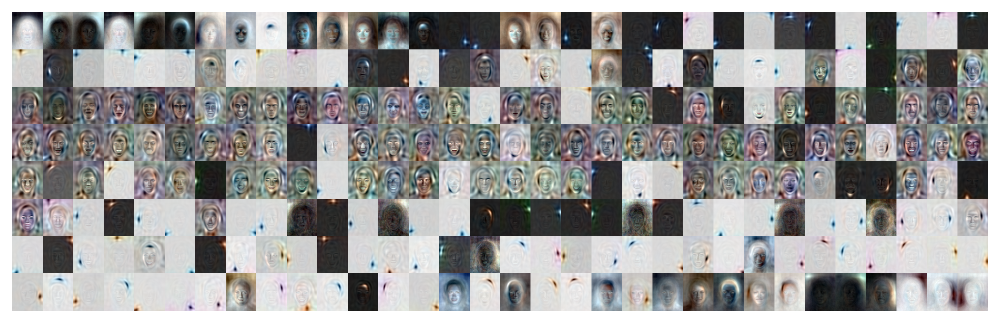

In [14]:
u0 = tonp(tr.model.layer.u_init[0].squeeze())
u1 = tonp(tr.model.layer.u_init[1].squeeze())
_ = tr.model.show(order=np.argsort(u0), nrows=8, dpi=600)

In [15]:
%%time


seq_total = 100

true, pred = [], []
for x, *_ in tqdm(iter(tr.dl_vld)):
    # xtract
    output = tr.model.xtract_ftr(
        feeder=tr.get_feeder(tr.to(x)),
        seq=range(seq_total),
        return_extras=['conditional'],
    ).stack()
    
    true.append(tonp(x.flatten(start_dim=1)))
    conditional = output['conditional'][str(seq_total - 1)]
    pred.append(tonp(conditional.loc))

del output
torch.cuda.empty_cache()
import gc
gc.collect()

true, pred = cat_map([true, pred])
error = true - pred
error.shape

100%|█████████████████████████████████████████| 199/199 [01:00<00:00,  3.31it/s]


CPU times: user 48min 54s, sys: 1min 19s, total: 50min 14s
Wall time: 1min 17s


(19867, 116412)

In [16]:
# order: high contrast
var = np.var(true, axis=1)
order = np.argsort(var)[::-1]

# get whitened data
# _, whitened, _ = make_dataset('Kyoto16', device)
# whitened = whitened.tensors[0].flatten(start_dim=1)
# whitened.shape

In [17]:
a = true.reshape((-1, *tr.model.cfg.input_sz))
a = np.transpose(a, axes=(0, 2, 3, 1))

b = pred.reshape((-1, *tr.model.cfg.input_sz))
b = np.transpose(b, axes=(0, 2, 3, 1))

c = a - b

a.shape, b.shape

((19867, 218, 178, 3), (19867, 218, 178, 3))

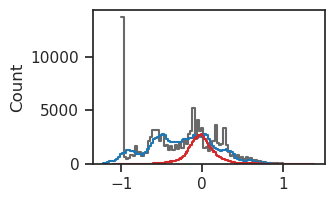

In [18]:
histplot(a[3].ravel(), color='dimgrey');
histplot(b[3].ravel(), color='C0');
histplot(c[3].ravel(), color='C3');

In [19]:
a_plot = np.clip((1 + a) / 2, a_min=0, a_max=1.0)
b_plot = np.clip((1 + b) / 2, a_min=0, a_max=1.0)
c_plot = np.clip((1 + c) / 2, a_min=0, a_max=1.0)

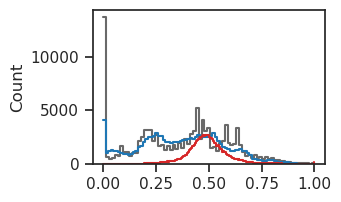

In [20]:
histplot(a_plot[3].ravel(), color='dimgrey');
histplot(b_plot[3].ravel(), color='C0');
histplot(c_plot[3].ravel(), color='C3');

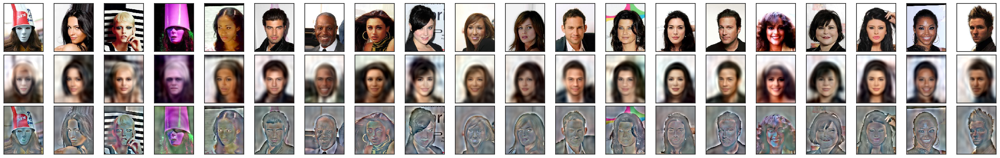

In [21]:
rng = get_rng(0)

ncols = 20
selected_ids = rng.choice(order[:500], ncols, replace=False)
fig, axes = create_figure(3, ncols, (1.3 * ncols, 4), 'all', 'all')

for i in range(ncols):
    img_i = selected_ids[i]
    axes[0, i].imshow(a_plot[img_i])
    axes[1, i].imshow(b_plot[img_i])
    axes[2, i].imshow(c_plot[img_i])

remove_ticks(axes, False)

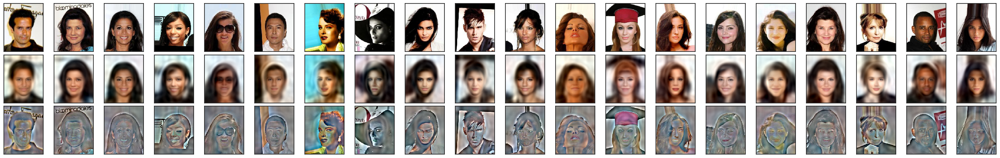

In [22]:
selected_ids = rng.choice(order[:500], ncols, replace=False)
fig, axes = create_figure(3, ncols, (1.3 * ncols, 4), 'all', 'all')

for i in range(ncols):
    img_i = selected_ids[i]
    axes[0, i].imshow(a_plot[img_i])
    axes[1, i].imshow(b_plot[img_i])
    axes[2, i].imshow(c_plot[img_i])

remove_ticks(axes, False)

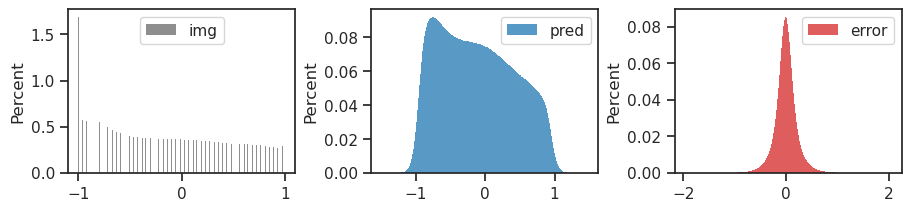

In [23]:
_plot_sample_hists()

In [24]:
true.shape, pred.shape, error.shape

((19867, 116412), (19867, 116412), (19867, 116412))

In [ ]:
## TODO: get a subset

OutOfMemoryError: CUDA out of memory. Tried to allocate 14.07 GiB. GPU 1 has a total capacity of 47.41 GiB of which 123.12 MiB is free. Including non-PyTorch memory, this process has 47.27 GiB memory in use. Of the allocated memory 46.41 GiB is allocated by PyTorch, and 366.19 MiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to avoid fragmentation.  See documentation for Memory Management  (https://pytorch.org/docs/stable/notes/cuda.html#environment-variables)

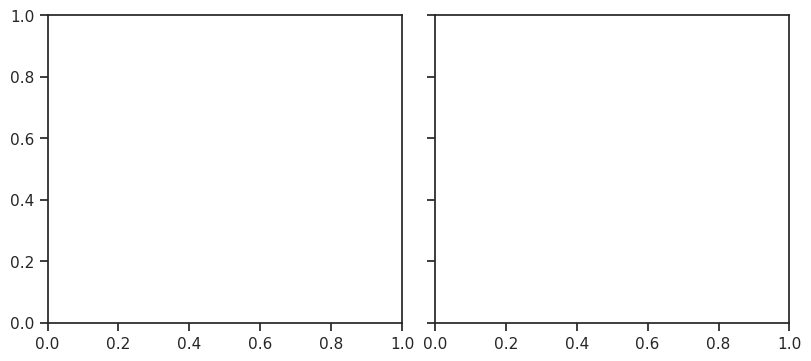

In [19]:
_plot_power_spectrum(normalize=False, add_whitened=False)
_plot_power_spectrum(normalize=True, add_whitened=False)